In [5]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sb
sb.set()

from nw2vec import batching
from nw2vec import graph

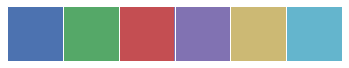

In [70]:
sb.palplot(sb.color_palette(n_colors=6))
blue, green, red, purple, yellow, cyan = sb.color_palette(n_colors=6)

In [ ]:
g = nx.planted_partition_graph(6, 10, .4, .008)
layout = nx.drawing.layout.spring_layout(g)

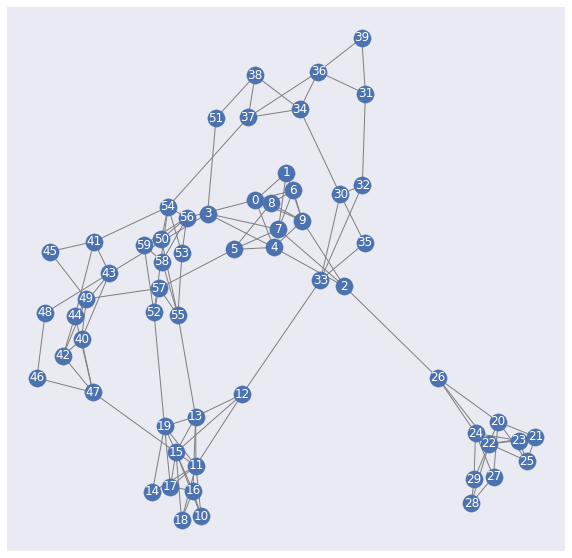

In [139]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xticks([])
ax.set_yticks([])
nx.draw_networkx(g, pos=layout,
                 node_size=300, with_labels=True, font_color='white',
                 edge_color='grey',
                 node_color=blue, vmin=0, vmax=1,
                 ax=ax)

## All mini-batches in a batch

In [148]:
def plot_seeding_batch(csg, seeds_per_batch, walk_length):
    n_batches = int(np.ceil(len(g.nodes) / seeds_per_batch))

    cols = 5
    rows = int(np.ceil(n_batches / cols))
    figscale = 5
    fig, axes = plt.subplots(rows, cols, figsize=(cols * figscale, rows * figscale), sharex=True, sharey=True)
    fig.tight_layout()

    drawn = set()
    for i, nodes in enumerate(batching.batch_walks(csg, seeds_per_batch, walk_length)):
        colors = np.ones((len(csg.nodes), 3)) * blue
        colors[list(drawn)] = green
        colors[list(nodes)] = red
        
        ax_index = i // cols, i % cols
        nx.draw_networkx(g, pos=layout,
                         node_size=80, with_labels=False,
                         edge_color='grey',
                         node_color=colors, vmin=0, vmax=1,
                         ax=axes[ax_index])
        axes[ax_index].set_xticks([])
        axes[ax_index].set_yticks([])
        drawn.update(nodes)

**Non-biased**

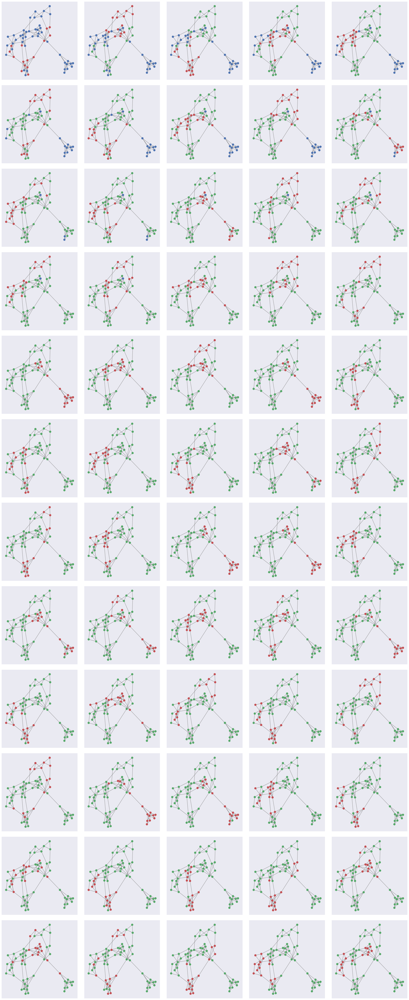

In [153]:
plot_seeding_batch(graph.get_csgraph(nx.adjacency_matrix(g), 1, 1), 1, 15)

**Walk on triangles**

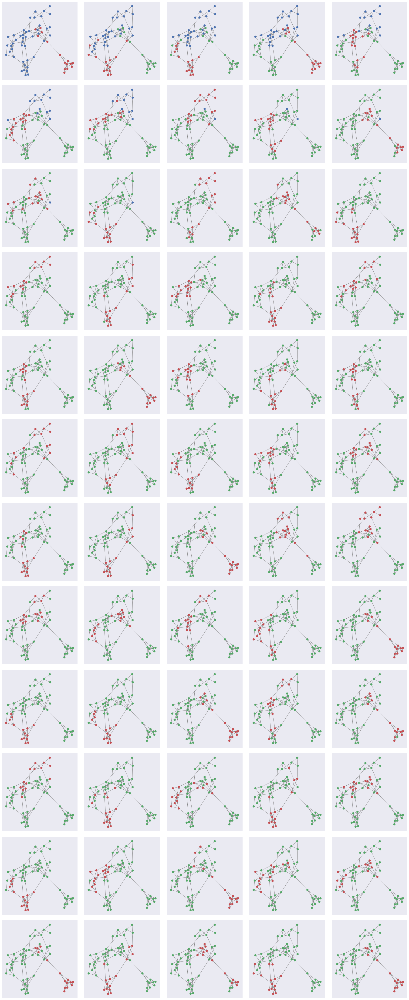

In [154]:
plot_seeding_batch(graph.get_csgraph(nx.adjacency_matrix(g), 100, 100), 1, 15)

**Walk out**

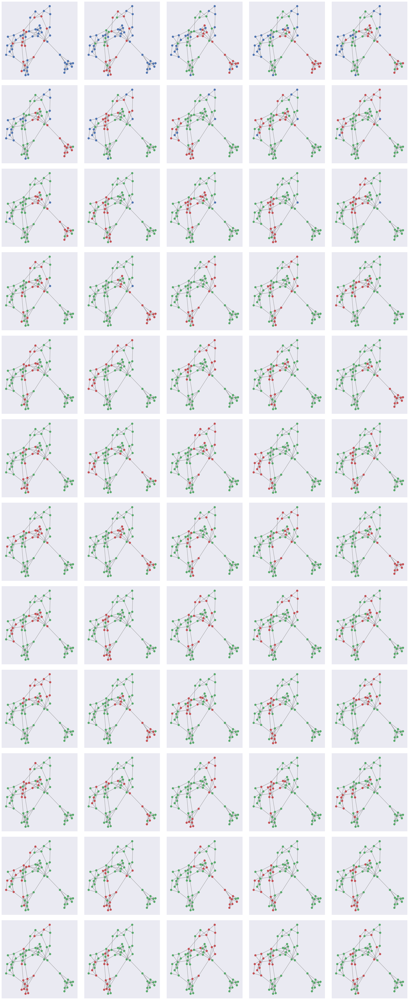

In [155]:
plot_seeding_batch(graph.get_csgraph(nx.adjacency_matrix(g), 1, .01), 1, 15)

**Walk back**

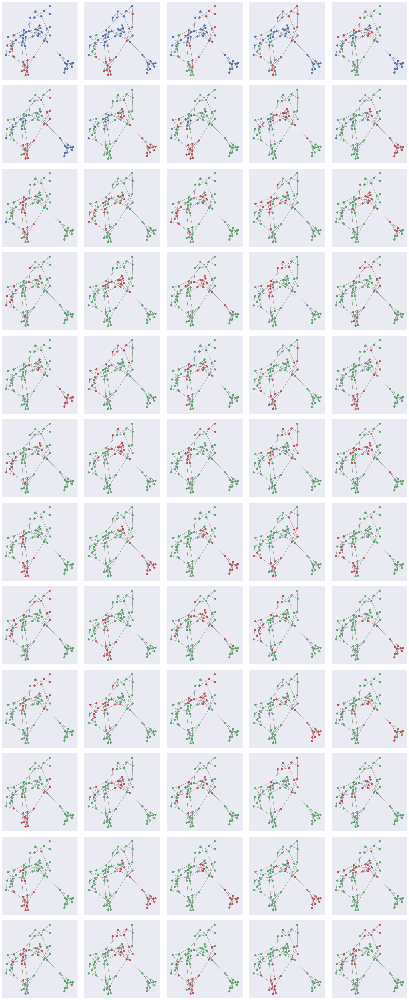

In [156]:
plot_seeding_batch(graph.get_csgraph(nx.adjacency_matrix(g), .01, 1), 1, 15)

## One walk

In [277]:
def plot_seed_walk(csg, seed, walk_length):
    figscale = 5
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(2 * figscale, figscale))
    fig.tight_layout()

    nodes = np.array(sorted(batching.distinct_random_walk(csg, seed, walk_length)))
    
    colors = np.ones((len(csg.nodes), 3)) * blue
    colors[nodes] = red
    colors[seed] = yellow
    
    nx.draw_networkx(g, pos=layout,
                     node_size=80, with_labels=False,
                     edge_color='grey',
                     node_color=colors, vmin=0, vmax=1,
                     ax=ax1)
    ax1.set_xticks([])
    ax1.set_yticks([])
    
    n_density_sampling = 50
    densities = np.zeros(n_density_sampling)
    for i in range(n_density_sampling):
        _nodes = np.array(sorted(batching.distinct_random_walk(csg, seed, walk_length)))
        densities[i] = csg.adj.toarray()[_nodes, :][:, _nodes].mean()
    avg_density = densities.mean()
    walk_adj = csg.adj.toarray()[nodes, :][:, nodes]
    ax2.imshow(walk_adj, cmap='viridis')
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.grid(False)
    ax2.text(.5, .02,
             'density = {:.2f}\navg density (out of {}) = {:.2f}'
             .format(walk_adj.mean(), n_density_sampling, avg_density),
             ha='center', va='bottom', transform=ax2.transAxes,
             fontdict=dict(size=15),
             bbox=dict(facecolor='white', alpha=0.9))

**Non-biased**

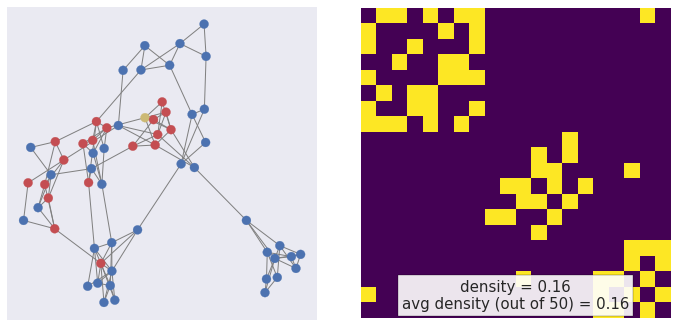

In [278]:
plot_seed_walk(graph.get_csgraph(nx.adjacency_matrix(g), 1, 1), 0, 20)

**Walk on triangles**

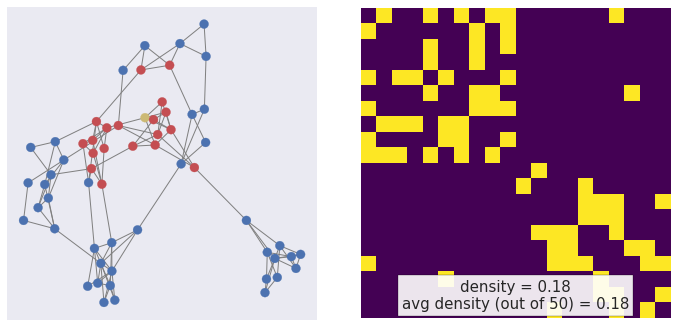

In [279]:
plot_seed_walk(graph.get_csgraph(nx.adjacency_matrix(g), 100, 100), 0, 20)

**Walk out**

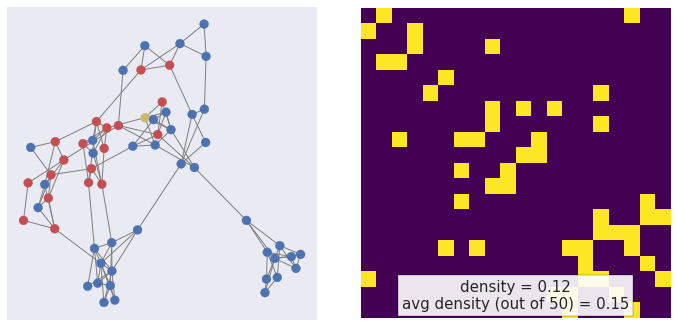

In [281]:
plot_seed_walk(graph.get_csgraph(nx.adjacency_matrix(g), 1, .01), 0, 20)

**Walk back**

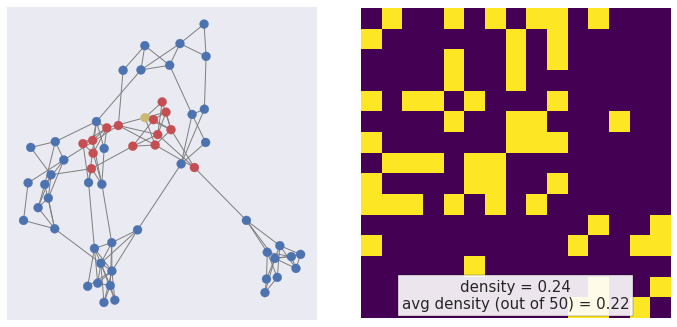

In [284]:
plot_seed_walk(graph.get_csgraph(nx.adjacency_matrix(g), .01, 1), 0, 15)